In [11]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/brain-tumor-images-dataset/no/34 no.jpg
/kaggle/input/brain-tumor-images-dataset/no/N20.JPG
/kaggle/input/brain-tumor-images-dataset/no/N1.JPG
/kaggle/input/brain-tumor-images-dataset/no/49 no.jpg
/kaggle/input/brain-tumor-images-dataset/no/N15.jpg
/kaggle/input/brain-tumor-images-dataset/no/No18.jpg
/kaggle/input/brain-tumor-images-dataset/no/31 no.jpg
/kaggle/input/brain-tumor-images-dataset/no/no 6.jpg
/kaggle/input/brain-tumor-images-dataset/no/3 no.jpg
/kaggle/input/brain-tumor-images-dataset/no/no 5.jpeg
/kaggle/input/brain-tumor-images-dataset/no/no 1.jpg
/kaggle/input/brain-tumor-images-dataset/no/26 no.jpg
/kaggle/input/brain-tumor-images-dataset/no/N26.JPG
/kaggle/input/brain-tumor-images-dataset/no/N5.jpg
/kaggle/input/brain-tumor-images-dataset/no/6 no.jpg
/kaggle/input/brain-tumor-images-dataset/no/No21.jpg
/kaggle/input/brain-tumor-images-dataset/no/17 no.jpg
/kaggle/input/brain-tumor-images-dataset/no/No22.jpg
/kaggle/input/brain-tumor-images-dataset/no/29 

In [12]:
!pip install opencv-python tqdm scikit-learn

Loading and preprocessing images...
Loading images from main directory...


  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]


Loading images from brain_tumor_dataset subdirectory...


  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]


Total images: 346
Images with tumor: 174
Images without tumor: 172
Image shape: (224, 224)

Generating visualizations...


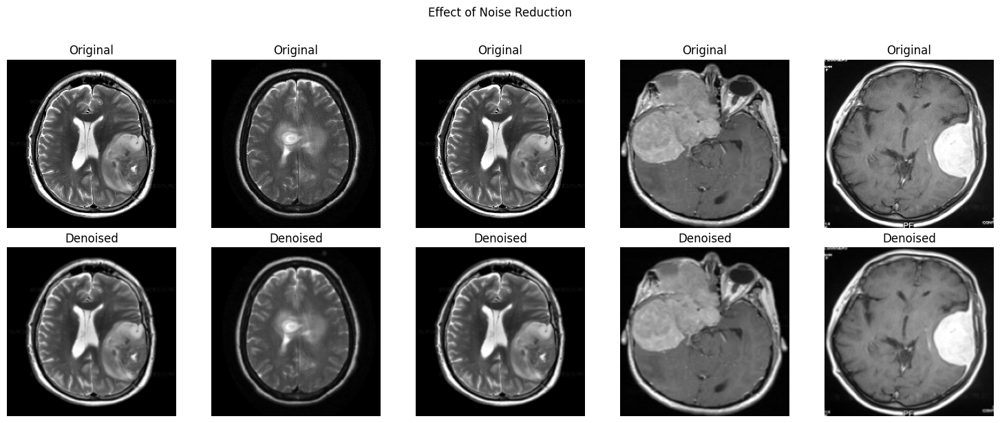

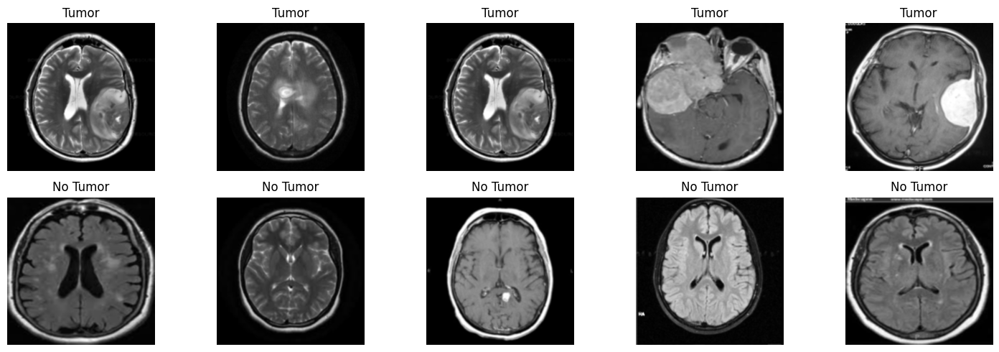

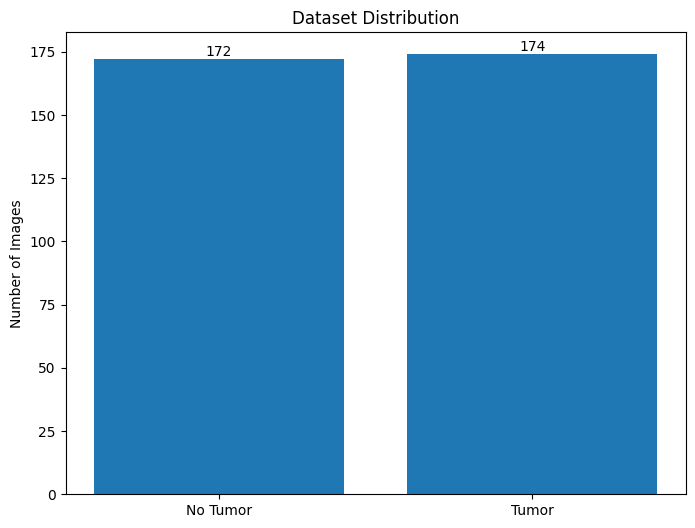

Saved processed data to /kaggle/working/processed_data


In [13]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.notebook import tqdm

def apply_weighted_average_filter(image):
    """
    Apply weighted average filter for noise reduction
    Using a 3x3 Gaussian kernel which gives more weight to center pixels
    """
    kernel = np.array([[1, 2, 1],
                      [2, 4, 2],
                      [1, 2, 1]]) / 16.0
    denoised = cv2.filter2D(image, -1, kernel)
    return denoised

def preprocess_single_image(img):
    """
    Preprocess a single image with noise reduction
    """
    # Convert to grayscale if needed
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Normalize to 0-1
    img = img.astype(float) / 255.0
    
    # Apply noise reduction
    img = apply_weighted_average_filter(img)
    
    return img

def load_and_preprocess_images(base_path, target_size=(224, 224)):
    """
    Load and preprocess images from both categories
    """
    images = []
    labels = []
    original_samples = []  # Store some original images for visualization
    categories = ['no', 'yes']
    
    # Process main directory
    print("Loading images from main directory...")
    for category in categories:
        path = Path(base_path) / category
        if path.exists():
            for img_path in tqdm(list(path.glob('*.[jp][pn][g]'))):
                try:
                    # Read image
                    original = cv2.imread(str(img_path))
                    original = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
                    original = cv2.resize(original, target_size)
                    
                    # Store some original samples for visualization
                    if len(original_samples) < 5 and category == 'yes':
                        original_samples.append(original)
                    
                    # Preprocess
                    img = preprocess_single_image(original)
                    
                    images.append(img)
                    labels.append(1 if category == 'yes' else 0)
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
    
    # Process subdirectory
    print("\nLoading images from brain_tumor_dataset subdirectory...")
    for category in categories:
        path = Path(base_path) / 'brain_tumor_dataset' / category
        if path.exists():
            for img_path in tqdm(list(path.glob('*.[jp][pn][g]'))):
                try:
                    original = cv2.imread(str(img_path))
                    img = preprocess_single_image(original)
                    img = cv2.resize(img, target_size)
                    
                    images.append(img)
                    labels.append(1 if category == 'yes' else 0)
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
    
    return np.array(images), np.array(labels), original_samples

def visualize_noise_reduction(original_samples, images, labels):
    """
    Visualize the effect of noise reduction
    """
    # Get corresponding processed images
    processed_samples = images[np.where(labels == 1)[0][:5]]
    
    plt.figure(figsize=(15, 6))
    
    # Plot original images
    for i in range(5):
        plt.subplot(2, 5, i + 1)
        plt.imshow(original_samples[i], cmap='gray')
        plt.title('Original')
        plt.axis('off')
    
    # Plot processed images
    for i in range(5):
        plt.subplot(2, 5, i + 6)
        plt.imshow(processed_samples[i], cmap='gray')
        plt.title('Denoised')
        plt.axis('off')
    
    plt.suptitle('Effect of Noise Reduction', y=1.02)
    plt.tight_layout()
    plt.show()

def visualize_samples(images, labels, num_samples=5):
    """
    Visualize sample images from both categories
    """
    plt.figure(figsize=(15, 5))
    
    # Plot tumor samples
    tumor_indices = np.where(labels == 1)[0]
    for i in range(num_samples):
        plt.subplot(2, num_samples, i + 1)
        plt.imshow(images[tumor_indices[i]], cmap='gray')
        plt.title('Tumor')
        plt.axis('off')
    
    # Plot non-tumor samples
    no_tumor_indices = np.where(labels == 0)[0]
    for i in range(num_samples):
        plt.subplot(2, num_samples, num_samples + i + 1)
        plt.imshow(images[no_tumor_indices[i]], cmap='gray')
        plt.title('No Tumor')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def plot_data_distribution(labels):
    """
    Plot distribution of tumor vs no-tumor images
    """
    counts = np.bincount(labels)
    plt.figure(figsize=(8, 6))
    plt.bar(['No Tumor', 'Tumor'], counts)
    plt.title('Dataset Distribution')
    plt.ylabel('Number of Images')
    for i, count in enumerate(counts):
        plt.text(i, count, str(count), ha='center', va='bottom')
    plt.show()

def save_processed_data(images, labels, save_path):
    """
    Save processed images and labels
    """
    save_path = Path(save_path)
    save_path.mkdir(exist_ok=True)
    
    np.save(save_path / 'processed_images.npy', images)
    np.save(save_path / 'labels.npy', labels)
    print(f"Saved processed data to {save_path}")

# Main execution
def main():
    # Set paths
    input_path = "/kaggle/input/brain-tumor-images-dataset"
    output_path = "/kaggle/working/processed_data"
    
    # Load and preprocess images
    print("Loading and preprocessing images...")
    images, labels, original_samples = load_and_preprocess_images(input_path)
    
    # Display dataset information
    print(f"\nTotal images: {len(images)}")
    print(f"Images with tumor: {np.sum(labels == 1)}")
    print(f"Images without tumor: {np.sum(labels == 0)}")
    print(f"Image shape: {images[0].shape}")
    
    # Visualizations
    print("\nGenerating visualizations...")
    visualize_noise_reduction(original_samples, images, labels)
    visualize_samples(images, labels)
    plot_data_distribution(labels)
    
    # Save processed data
    save_processed_data(images, labels, output_path)

# Run the preprocessing
if __name__ == "__main__":
    main()

In [14]:
import os
import numpy as np
import cv2
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import shutil
from tqdm import tqdm


In [15]:

class BrainMRIPreprocessor:
    def __init__(self, base_path, target_size=(224, 224)):
        self.base_path = Path(base_path)
        self.target_size = target_size
        self.processed_path = self.base_path / 'processed_dataset'
        
    def preprocess_image(self, image_path):
        """
        Preprocess a single image:
        1. Read image
        2. Convert to grayscale if needed
        3. Resize to target size
        4. Normalize pixel values
        5. Apply contrast enhancement
        """
        # Read image
        img = cv2.imread(str(image_path))
        if img is None:
            raise ValueError(f"Could not load image at {image_path}")
            
        # Convert to grayscale if image is RGB
        if len(img.shape) == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            
        # Resize image
        img = cv2.resize(img, self.target_size, interpolation=cv2.INTER_AREA)
        
        # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        img = clahe.apply(img)
        
        # Normalize pixel values to range [0,1]
        img = img.astype(np.float32) / 255.0
        
        return img
    
    

Loading and preprocessing images...
Loading and preprocessing images...


  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]


Total images: 173
Images with tumor: 87
Images without tumor: 86

Visualizing preprocessing steps...


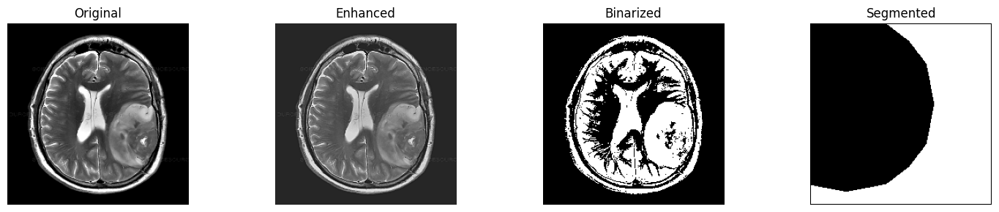


Saved processed data to /kaggle/working/processed_data


In [16]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.notebook import tqdm
from scipy import ndimage

def enhance_image(image):
    """
    Enhance image using high-pass Gaussian filtering
    """
    # Create Gaussian blur
    gaussian = cv2.GaussianBlur(image, (5, 5), 1.0)
    # High-pass filter
    enhanced = cv2.addWeighted(image, 1.5, gaussian, -0.5, 0)
    # Normalize
    enhanced = cv2.normalize(enhanced, None, 0, 1, cv2.NORM_MINMAX)
    return enhanced

def binarize_image(image, threshold=None):
    """
    Binarize image using Otsu's method if threshold not provided
    """
    if threshold is None:
        # Scale to 0-255 for Otsu's method
        img_255 = (image * 255).astype(np.uint8)
        threshold, binary = cv2.threshold(img_255, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        binary = binary / 255.0
    else:
        binary = (image > threshold).astype(float)
    return binary

def segment_image(image):
    """
    Segment image using watershed algorithm and morphological operations
    """
    # Convert to uint8
    img_255 = (image * 255).astype(np.uint8)
    
    # Noise removal
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(img_255, cv2.MORPH_OPEN, kernel, iterations=2)
    
    # Sure background
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    
    # Finding sure foreground
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.5*dist_transform.max(), 255, 0)
    sure_fg = sure_fg.astype(np.uint8)
    
    # Finding unknown region
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    # Marker labelling
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    # Apply watershed
    markers = cv2.watershed(cv2.cvtColor(img_255, cv2.COLOR_GRAY2BGR), markers)
    
    # Normalize to 0-1
    segmented = (markers > 1).astype(float)
    
    return segmented

def preprocess_single_image(img):
    """
    Complete preprocessing pipeline for a single image
    """
    # Convert to grayscale if needed
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Normalize to 0-1
    img = img.astype(float) / 255.0
    
    # Store intermediate results
    results = {
        'original': img.copy(),
        'enhanced': enhance_image(img),
    }
    
    # Binarize the enhanced image
    results['binary'] = binarize_image(results['enhanced'])
    
    # Segment the enhanced image
    results['segmented'] = segment_image(results['enhanced'])
    
    return results

def visualize_preprocessing_steps(image_dict):
    """
    Visualize all preprocessing steps for a single image
    """
    plt.figure(figsize=(15, 3))
    titles = ['Original', 'Enhanced', 'Binarized', 'Segmented']
    images = [image_dict['original'], image_dict['enhanced'], 
             image_dict['binary'], image_dict['segmented']]
    
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def load_and_preprocess_images(base_path, target_size=(224, 224)):
    """
    Load and preprocess images from both categories
    """
    processed_images = []
    labels = []
    sample_steps = None
    categories = ['no', 'yes']
    
    # Process main directory
    print("Loading and preprocessing images...")
    for category in categories:
        path = Path(base_path) / category
        if path.exists():
            for img_path in tqdm(list(path.glob('*.[jp][pn][g]'))):
                try:
                    # Read and resize image
                    img = cv2.imread(str(img_path))
                    img = cv2.resize(img, target_size)
                    
                    # Apply preprocessing pipeline
                    results = preprocess_single_image(img)
                    
                    # Store first example of preprocessing steps for visualization
                    if sample_steps is None and category == 'yes':
                        sample_steps = results
                    
                    # Store the segmented result as final processed image
                    processed_images.append(results['segmented'])
                    labels.append(1 if category == 'yes' else 0)
                    
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
    
    return np.array(processed_images), np.array(labels), sample_steps

def main():
    # Set paths
    input_path = "/kaggle/input/brain-tumor-images-dataset"
    output_path = "/kaggle/working/processed_data"
    
    # Load and preprocess images
    print("Loading and preprocessing images...")
    images, labels, sample_steps = load_and_preprocess_images(input_path)
    
    # Display dataset information
    print(f"\nTotal images: {len(images)}")
    print(f"Images with tumor: {np.sum(labels == 1)}")
    print(f"Images without tumor: {np.sum(labels == 0)}")
    
    # Visualize preprocessing steps
    print("\nVisualizing preprocessing steps...")
    visualize_preprocessing_steps(sample_steps)
    
    # Save processed data
    save_path = Path(output_path)
    save_path.mkdir(exist_ok=True)
    np.save(save_path / 'processed_images.npy', images)
    np.save(save_path / 'labels.npy', labels)
    print(f"\nSaved processed data to {output_path}")

if __name__ == "__main__":
    main()

Loading and preprocessing images...
Loading and preprocessing images...


  0%|          | 0/86 [00:00<?, ?it/s]

  0%|          | 0/87 [00:00<?, ?it/s]


Total images: 173
Images with tumor: 87
Images without tumor: 86

Visualizing preprocessing steps...


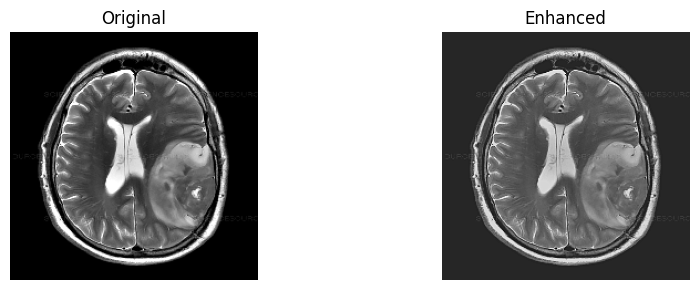


Saved processed data to /kaggle/working/processed_data


In [17]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.notebook import tqdm

def enhance_image(image):
    """
    Enhance image using high-pass Gaussian filtering
    """
    # Create Gaussian blur
    gaussian = cv2.GaussianBlur(image, (5, 5), 1.0)
    # High-pass filter
    enhanced = cv2.addWeighted(image, 1.5, gaussian, -0.5, 0)
    # Normalize
    enhanced = cv2.normalize(enhanced, None, 0, 1, cv2.NORM_MINMAX)
    return enhanced

def preprocess_single_image(img):
    """
    Complete preprocessing pipeline for a single image
    """
    # Convert to grayscale if needed
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Normalize to 0-1
    img = img.astype(float) / 255.0
    
    # Store intermediate results
    results = {
        'original': img.copy(),
        'enhanced': enhance_image(img),
    }
    
    return results

def visualize_preprocessing_steps(image_dict):
    """
    Visualize all preprocessing steps for a single image
    """
    plt.figure(figsize=(10, 3))
    titles = ['Original', 'Enhanced']
    images = [image_dict['original'], image_dict['enhanced']]
    
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, 2, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def load_and_preprocess_images(base_path, target_size=(224, 224)):
    """
    Load and preprocess images from both categories
    """
    processed_images = []
    labels = []
    sample_steps = None
    categories = ['no', 'yes']
    
    # Process main directory
    print("Loading and preprocessing images...")
    for category in categories:
        path = Path(base_path) / category
        if path.exists():
            for img_path in tqdm(list(path.glob('*.[jp][pn][g]'))):
                try:
                    # Read and resize image
                    img = cv2.imread(str(img_path))
                    img = cv2.resize(img, target_size)
                    
                    # Apply preprocessing pipeline
                    results = preprocess_single_image(img)
                    
                    # Store first example of preprocessing steps for visualization
                    if sample_steps is None and category == 'yes':
                        sample_steps = results
                    
                    # Store the enhanced result as final processed image
                    processed_images.append(results['enhanced'])
                    labels.append(1 if category == 'yes' else 0)
                    
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
    
    return np.array(processed_images), np.array(labels), sample_steps

def main():
    # Set paths
    input_path = "/kaggle/input/brain-tumor-images-dataset"
    output_path = "/kaggle/working/processed_data"
    
    # Load and preprocess images
    print("Loading and preprocessing images...")
    images, labels, sample_steps = load_and_preprocess_images(input_path)
    
    # Display dataset information
    print(f"\nTotal images: {len(images)}")
    print(f"Images with tumor: {np.sum(labels == 1)}")
    print(f"Images without tumor: {np.sum(labels == 0)}")
    
    # Visualize preprocessing steps
    print("\nVisualizing preprocessing steps...")
    visualize_preprocessing_steps(sample_steps)
    
    # Save processed data
    save_path = Path(output_path)
    save_path.mkdir(exist_ok=True)
    np.save(save_path / 'processed_images.npy', images)
    np.save(save_path / 'labels.npy', labels)
    print(f"\nSaved processed data to {output_path}")

if __name__ == "__main__":
    main()


Enhancing and colorizing images...
Processing 86 images from category 'no'


  0%|          | 0/86 [00:00<?, ?it/s]

Processing 87 images from category 'yes'


  0%|          | 0/87 [00:00<?, ?it/s]

Total images processed: 173

Visualizing colorization examples...


<ipython-input-19-11b439ee7459>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colored = plt.cm.get_cmap(colormap)(img)


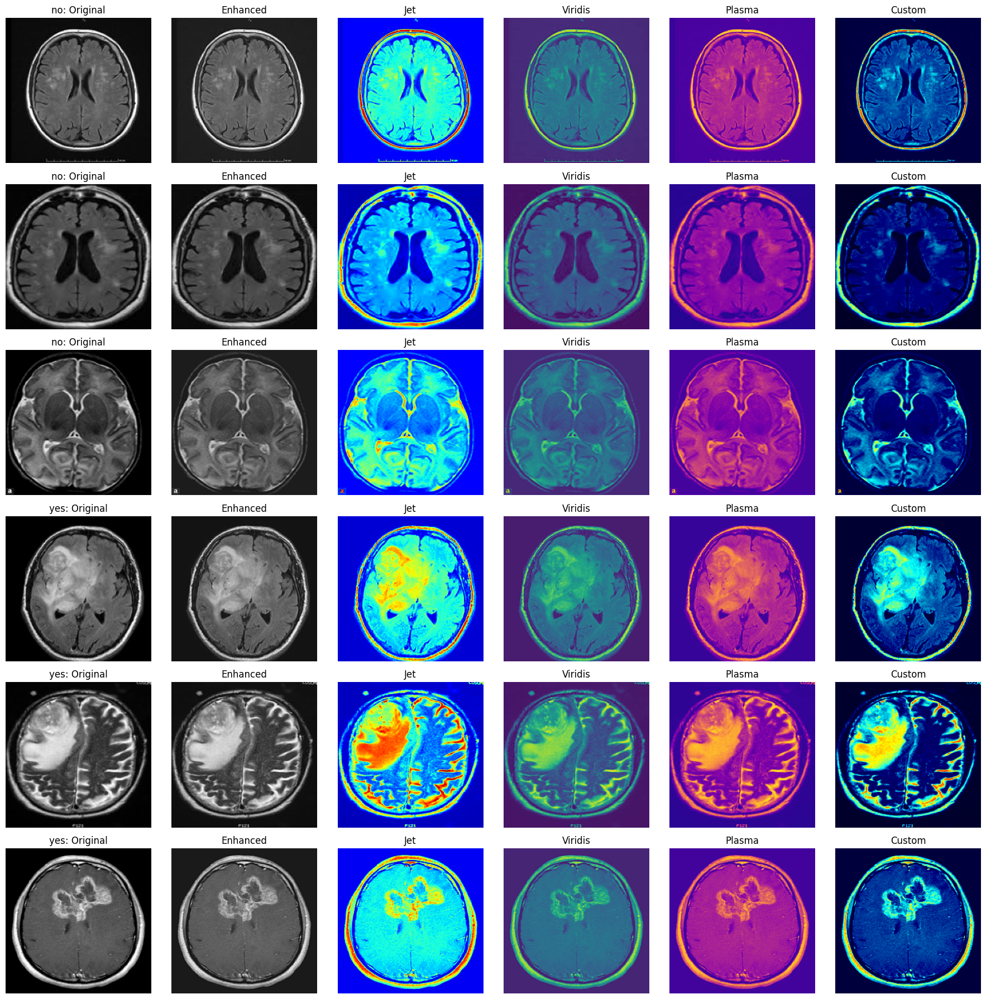


Colorized images saved to /kaggle/working/colorized_images


In [19]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.notebook import tqdm
from matplotlib.colors import LinearSegmentedColormap

def colorize_brain_image(img, colormap='jet'):
    """
    Apply colormap to grayscale brain MRI image.
    
    Args:
        img: Grayscale image normalized to [0,1]
        colormap: Name of matplotlib colormap or custom colormap
    
    Returns:
        Colorized image as RGB with values in [0,1]
    """
    # Apply colormap (returns values from 0-1)
    if isinstance(colormap, str):
        # Use matplotlib colormap
        colored = plt.cm.get_cmap(colormap)(img)
        # Remove alpha channel if present
        if colored.shape[-1] == 4:
            colored = colored[..., :3]
    else:
        # Use custom colormap
        colored = colormap(img)
        
    return colored

def create_tumor_highlight_colormap():
    """
    Create a custom colormap that emphasizes potential tumor regions.
    - Dark blue/purple for background/normal tissue
    - Yellow/red for potential tumor regions (high intensity)
    """
    # Define colors for custom colormap (position, (R,G,B))
    colors = [
        (0.0, (0.0, 0.0, 0.1)),    # Dark blue for background
        (0.3, (0.0, 0.0, 0.5)),    # Blue for normal tissue
        (0.6, (0.0, 1.0, 1.0)),    # Cyan for intermediate intensity
        (0.8, (1.0, 1.0, 0.0)),    # Yellow for high intensity
        (1.0, (1.0, 0.0, 0.0))     # Red for very high intensity (potential tumor)
    ]
    
    # Create colormap
    cmap_name = 'tumor_highlight'
    return LinearSegmentedColormap.from_list(cmap_name, colors)

def enhance_and_colorize_images(input_path, output_path, target_size=(224, 224)):
    """
    Load, enhance, and colorize brain MRI images from both categories.
    Save the results to the specified output directory.
    """
    Path(output_path).mkdir(exist_ok=True, parents=True)
    
    # Create subdirectories for colorized images
    for subdir in ['no', 'yes']:
        (Path(output_path) / subdir).mkdir(exist_ok=True)
    
    # Create custom colormap for tumor highlighting
    tumor_cmap = create_tumor_highlight_colormap()
    
    # Standard colormaps to try
    colormaps = {
        'jet': plt.cm.jet,
        'viridis': plt.cm.viridis,
        'plasma': plt.cm.plasma,
        'custom': tumor_cmap
    }
    
    # Process images from both categories
    categories = ['no', 'yes']
    total_processed = 0
    
    for category in categories:
        category_path = Path(input_path) / category
        output_category_path = Path(output_path) / category
        
        if not category_path.exists():
            print(f"Warning: Path {category_path} does not exist")
            continue
        
        image_files = list(category_path.glob('*.[jp][pn][g]'))
        print(f"Processing {len(image_files)} images from category '{category}'")
        
        for img_path in tqdm(image_files):
            try:
                # Read and resize image
                img = cv2.imread(str(img_path))
                img = cv2.resize(img, target_size)
                
                # Apply preprocessing
                results = preprocess_single_image(img)
                enhanced = results['enhanced']
                
                # Apply and save different colorized versions
                file_stem = img_path.stem
                
                # Apply each colormap and save
                for cmap_name, cmap in colormaps.items():
                    colorized = colorize_brain_image(enhanced, cmap)
                    
                    # Convert to uint8 for saving (0-255)
                    colorized_uint8 = (colorized * 255).astype(np.uint8)
                    
                    # Convert from RGB to BGR for OpenCV
                    colorized_bgr = cv2.cvtColor(colorized_uint8, cv2.COLOR_RGB2BGR)
                    
                    # Save colorized image
                    output_file = output_category_path / f"{file_stem}_{cmap_name}.jpg"
                    cv2.imwrite(str(output_file), colorized_bgr)
                
                total_processed += 1
                
            except Exception as e:
                print(f"Error processing {img_path}: {e}")
    
    print(f"Total images processed: {total_processed}")
    return output_path

def visualize_colorization_examples(input_path, n_samples=3):
    """
    Visualize examples of different colorization techniques for randomly selected images.
    """
    # Select sample images from both categories
    categories = ['no', 'yes']
    sample_images = []
    
    for category in categories:
        category_path = Path(input_path) / category
        if not category_path.exists():
            continue
            
        # Get all original images
        image_files = list(category_path.glob('*.[jp][pn][g]'))
        
        # Select random samples
        if len(image_files) > 0:
            samples = np.random.choice(image_files, min(n_samples, len(image_files)), replace=False)
            sample_images.extend([(img_path, category) for img_path in samples])
    
    if not sample_images:
        print("No sample images found")
        return
    
    # Set up visualization
    n_rows = len(sample_images)
    n_cols = 6  # Original, Enhanced, Jet, Viridis, Plasma, Custom
    
    plt.figure(figsize=(n_cols * 3, n_rows * 3))
    
    # Create custom colormap
    tumor_cmap = create_tumor_highlight_colormap()
    
    for i, (img_path, category) in enumerate(sample_images):
        # Read image and preprocess
        img = cv2.imread(str(img_path))
        img = cv2.resize(img, (224, 224))
        results = preprocess_single_image(img)
        
        # Get original and enhanced
        original = results['original']
        enhanced = results['enhanced']
        
        # Colorize with different colormaps
        jet_colored = colorize_brain_image(enhanced, 'jet')
        viridis_colored = colorize_brain_image(enhanced, 'viridis')
        plasma_colored = colorize_brain_image(enhanced, 'plasma')
        custom_colored = colorize_brain_image(enhanced, tumor_cmap)
        
        # Plot row
        plt.subplot(n_rows, n_cols, i * n_cols + 1)
        plt.imshow(original, cmap='gray')
        plt.title(f"{category}: Original")
        plt.axis('off')
        
        plt.subplot(n_rows, n_cols, i * n_cols + 2)
        plt.imshow(enhanced, cmap='gray')
        plt.title("Enhanced")
        plt.axis('off')
        
        plt.subplot(n_rows, n_cols, i * n_cols + 3)
        plt.imshow(jet_colored)
        plt.title("Jet")
        plt.axis('off')
        
        plt.subplot(n_rows, n_cols, i * n_cols + 4)
        plt.imshow(viridis_colored)
        plt.title("Viridis")
        plt.axis('off')
        
        plt.subplot(n_rows, n_cols, i * n_cols + 5)
        plt.imshow(plasma_colored)
        plt.title("Plasma")
        plt.axis('off')
        
        plt.subplot(n_rows, n_cols, i * n_cols + 6)
        plt.imshow(custom_colored)
        plt.title("Custom")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def main():
    # Set paths
    input_path = "/kaggle/input/brain-tumor-images-dataset/brain_tumor_dataset"
    output_path = "/kaggle/working/colorized_images"
    
    # Create colorized versions of images
    print("Enhancing and colorizing images...")
    output_dir = enhance_and_colorize_images(input_path, output_path)
    
    # Visualize examples
    print("\nVisualizing colorization examples...")
    visualize_colorization_examples(input_path)
    
    print(f"\nColorized images saved to {output_dir}")

if __name__ == "__main__":
    main()


--------------------------------------------------
Training and evaluating model with jet colormap
--------------------------------------------------
Loading jet colorized images...
Found 86 no images with jet colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Found 86 yes images with jet colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Training set: 109 images
Validation set: 28 images
Test set: 35 images


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 224, 224, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 112, 112, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 56, 56, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 51,672,097 (197.11 MB)

 Trainable params: 51,670,177 (197.11 MB)

 Non-trainable params: 1,920 (7.50 KB)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 25s 7s/step - accuracy: 0.6458 - auc: 0.7156 - loss: 1.0061 - val_accuracy: 0.5000 - val_auc: 0.7066 - val_loss: 0.8230 - learning_rate: 0.0010
Epoch 2/20
1/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.7692 - auc: 0.8889 - loss: 0.7254

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 513ms/step - accuracy: 0.7692 - auc: 0.8889 - loss: 0.7254 - val_accuracy: 0.5000 - val_auc: 0.7194 - val_loss: 0.7637 - learning_rate: 0.0010
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 5s/step - accuracy: 0.7504 - auc: 0.8341 - loss: 0.8305 - val_accuracy: 0.5357 - val_auc: 0.6888 - val_loss: 0.8248 - learning_rate: 0.0010
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 503ms/step - accuracy: 0.5000 - auc: 0.6445 - loss: 1.7345 - val_accuracy: 0.5714 - val_auc: 0.6990 - val_loss: 0.8097 - learning_rate: 0.0010
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 5s/step - accuracy: 0.5891 - auc: 0.5912 - loss: 1.4043 - val_accuracy: 0.6786 - val_auc: 0.7143 - val_loss: 0.7361 - learning_rate: 0.0010
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 520ms/step - accuracy: 0.6250 - auc: 0.5714 - loss: 0.9919 - val_accuracy: 0.6429 - val_auc: 0.7194 - val_loss: 0.6975 - learning_rate: 0.0010
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 6s/step - accuracy: 0.4348 - auc: 0.5585 - loss: 1.0044 - val_acc

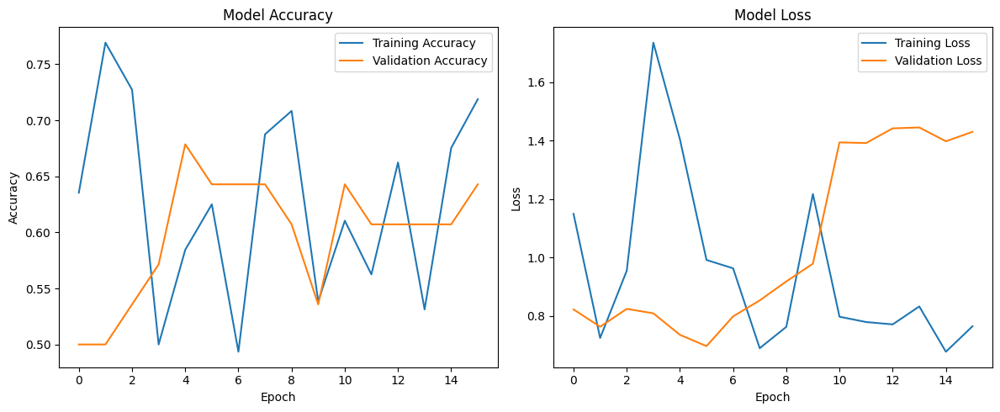

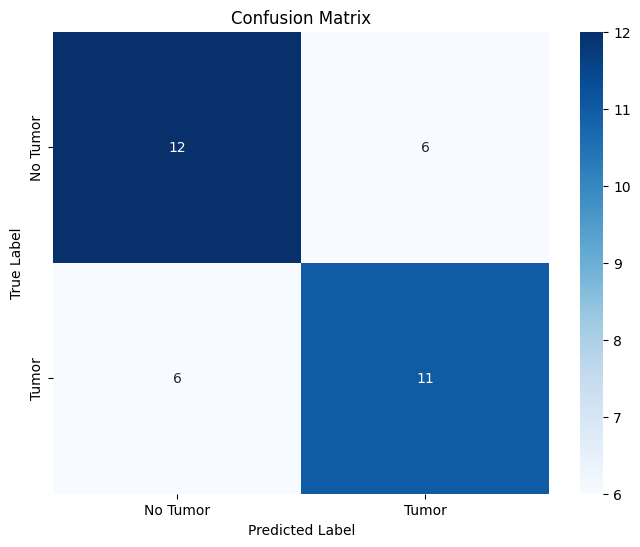

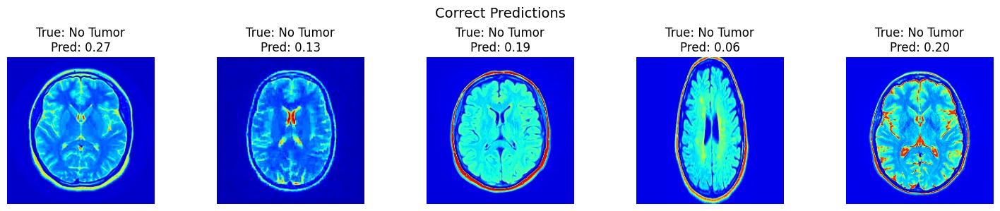

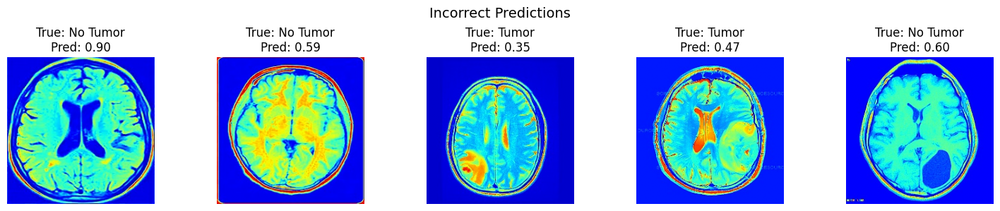


Test Accuracy: 0.6571

Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.67      0.67        18
           1       0.65      0.65      0.65        17

    accuracy                           0.66        35
   macro avg       0.66      0.66      0.66        35
weighted avg       0.66      0.66      0.66        35


--------------------------------------------------
Training and evaluating model with viridis colormap
--------------------------------------------------
Loading viridis colorized images...
Found 86 no images with viridis colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Found 86 yes images with viridis colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Training set: 109 images
Validation set: 28 images
Test set: 35 images


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 224, 224, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 112, 112, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 56, 56, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 51,672,097 (197.11 MB)

 Trainable params: 51,670,177 (197.11 MB)

 Non-trainable params: 1,920 (7.50 KB)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.4647 - auc: 0.5081 - loss: 1.9121 - val_accuracy: 0.4286 - val_auc: 0.4821 - val_loss: 0.7037 - learning_rate: 0.0010
Epoch 2/20
1/3 ━━━━━━━━━━━━━━━━━━━━ 11s 6s/step - accuracy: 0.5312 - auc: 0.5774 - loss: 1.9589

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 647ms/step - accuracy: 0.5312 - auc: 0.5774 - loss: 1.9589 - val_accuracy: 0.5000 - val_auc: 0.6301 - val_loss: 0.7601 - learning_rate: 0.0010
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 5s/step - accuracy: 0.5631 - auc: 0.5390 - loss: 1.7492 - val_accuracy: 0.5000 - val_auc: 0.7526 - val_loss: 0.8199 - learning_rate: 0.0010
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 538ms/step - accuracy: 0.5312 - auc: 0.5686 - loss: 1.0404 - val_accuracy: 0.5000 - val_auc: 0.7423 - val_loss: 0.7804 - learning_rate: 0.0010
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.7064 - auc: 0.7693 - loss: 0.6820 - val_accuracy: 0.5000 - val_auc: 0.7347 - val_loss: 0.8485 - learning_rate: 0.0010
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 500ms/step - accuracy: 0.6562 - auc: 0.6958 - loss: 0.8492 - val_accuracy: 0.5000 - val_auc: 0.7347 - val_loss: 0.8666 - learning_rate: 0.0010
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.6471 - auc: 0.7064 - loss: 0.7917 - val_acc

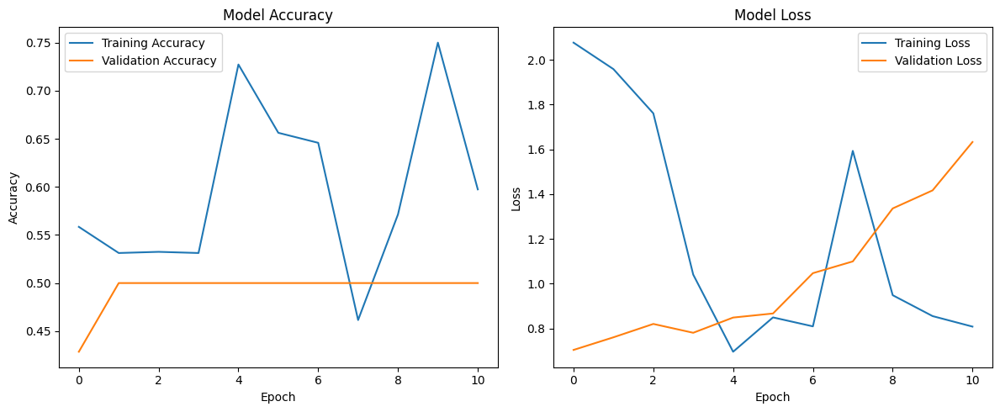

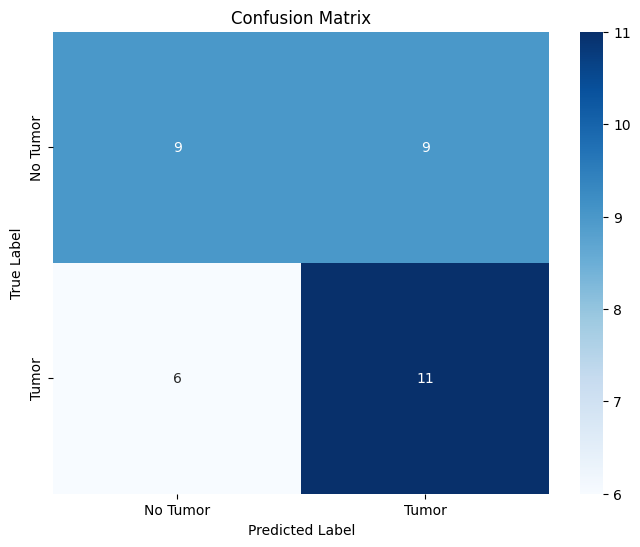

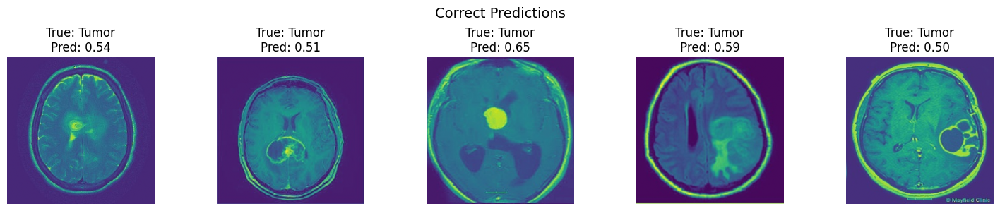

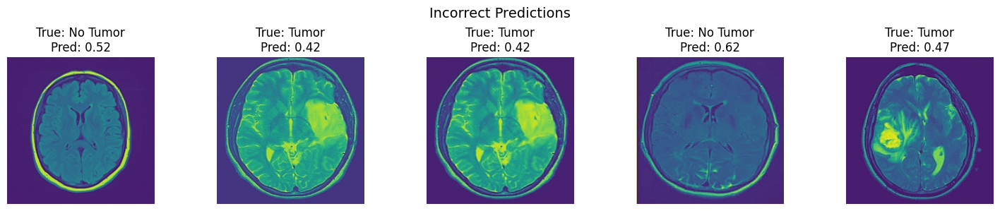


Test Accuracy: 0.5714

Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.50      0.55        18
           1       0.55      0.65      0.59        17

    accuracy                           0.57        35
   macro avg       0.57      0.57      0.57        35
weighted avg       0.58      0.57      0.57        35


--------------------------------------------------
Training and evaluating model with plasma colormap
--------------------------------------------------
Loading plasma colorized images...
Found 86 no images with plasma colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Found 86 yes images with plasma colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Training set: 109 images
Validation set: 28 images
Test set: 35 images


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 224, 224, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 112, 112, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 56, 56, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_19               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 51,672,097 (197.11 MB)

 Trainable params: 51,670,177 (197.11 MB)

 Non-trainable params: 1,920 (7.50 KB)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 7s/step - accuracy: 0.5176 - auc: 0.5578 - loss: 1.3453 - val_accuracy: 0.5000 - val_auc: 0.6582 - val_loss: 0.7193 - learning_rate: 0.0010
Epoch 2/20
1/3 ━━━━━━━━━━━━━━━━━━━━ 24s 12s/step - accuracy: 0.6875 - auc: 0.7451 - loss: 0.8430

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


3/3 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.6875 - auc: 0.7451 - loss: 0.8430 - val_accuracy: 0.5000 - val_auc: 0.6454 - val_loss: 0.8718 - learning_rate: 0.0010
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step - accuracy: 0.5717 - auc: 0.6119 - loss: 1.3082 - val_accuracy: 0.5000 - val_auc: 0.7398 - val_loss: 1.2689 - learning_rate: 0.0010
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 533ms/step - accuracy: 0.5938 - auc: 0.7294 - loss: 0.8559 - val_accuracy: 0.5000 - val_auc: 0.7704 - val_loss: 1.3047 - learning_rate: 0.0010
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.7148 - auc: 0.7862 - loss: 0.7346 - val_accuracy: 0.5000 - val_auc: 0.8291 - val_loss: 1.3218 - learning_rate: 0.0010
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 520ms/step - accuracy: 0.6923 - auc: 0.7750 - loss: 0.7946 - val_accuracy: 0.5000 - val_auc: 0.7959 - val_loss: 1.3670 - learning_rate: 0.0010
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.6693 - auc: 0.6890 - loss: 0.9267 - val_accur

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


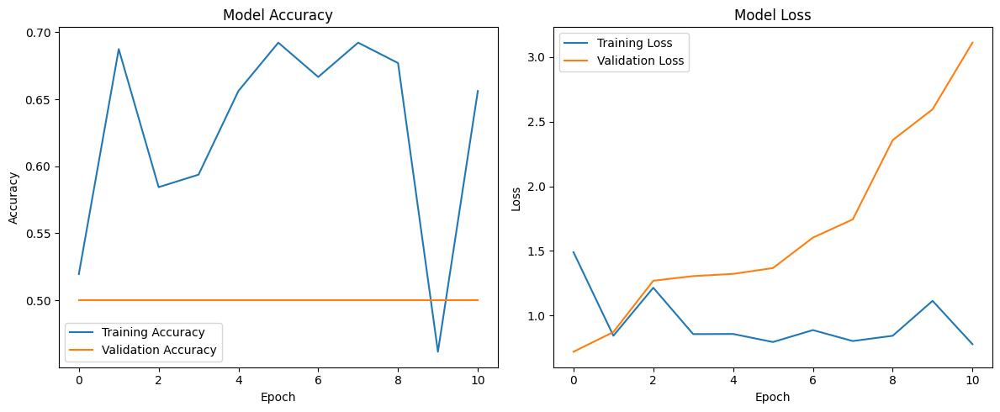

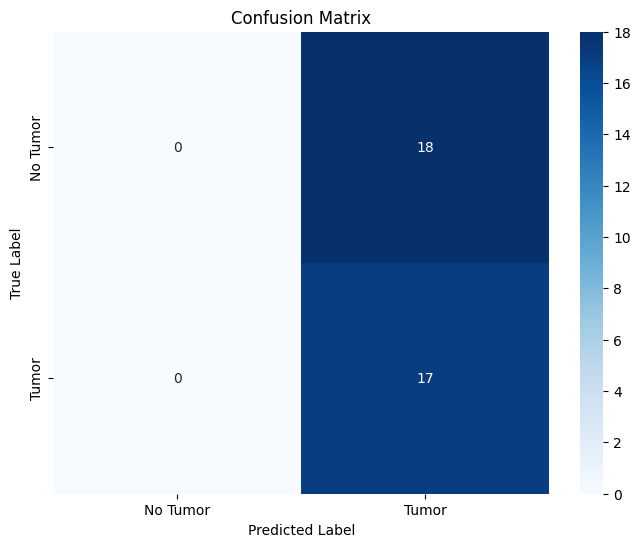

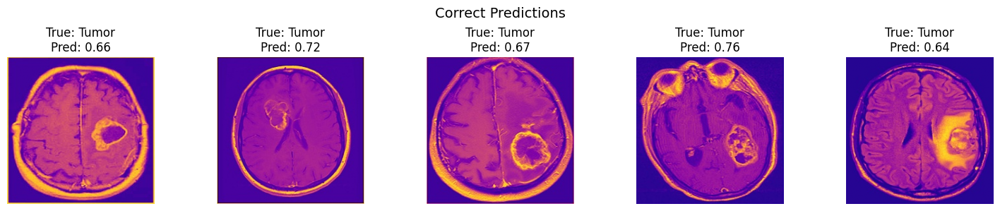

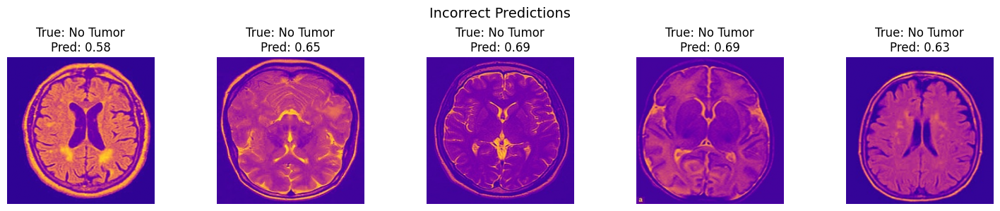


Test Accuracy: 0.4857

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        18
           1       0.49      1.00      0.65        17

    accuracy                           0.49        35
   macro avg       0.24      0.50      0.33        35
weighted avg       0.24      0.49      0.32        35


--------------------------------------------------
Training and evaluating model with custom colormap
--------------------------------------------------
Loading custom colorized images...
Found 86 no images with custom colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Found 86 yes images with custom colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Training set: 109 images
Validation set: 28 images
Test set: 35 images


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 224, 224, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 112, 112, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_25               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_23 (Conv2D)                   │ (None, 56, 56, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_26               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 51,672,097 (197.11 MB)

 Trainable params: 51,670,177 (197.11 MB)

 Non-trainable params: 1,920 (7.50 KB)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step - accuracy: 0.4772 - auc: 0.5800 - loss: 1.2553 - val_accuracy: 0.5000 - val_auc: 0.3750 - val_loss: 0.7361 - learning_rate: 0.0010
Epoch 2/20
1/3 ━━━━━━━━━━━━━━━━━━━━ 11s 6s/step - accuracy: 0.5938 - auc: 0.5859 - loss: 1.5412

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 541ms/step - accuracy: 0.5938 - auc: 0.5859 - loss: 1.5412 - val_accuracy: 0.5000 - val_auc: 0.3673 - val_loss: 0.7262 - learning_rate: 0.0010
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.5288 - auc: 0.5650 - loss: 1.1527 - val_accuracy: 0.5000 - val_auc: 0.5434 - val_loss: 0.7251 - learning_rate: 0.0010
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 545ms/step - accuracy: 0.5938 - auc: 0.6146 - loss: 0.9113 - val_accuracy: 0.5000 - val_auc: 0.6276 - val_loss: 0.7180 - learning_rate: 0.0010
Epoch 5/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 5s/step - accuracy: 0.6378 - auc: 0.6756 - loss: 0.8253 - val_accuracy: 0.4286 - val_auc: 0.4388 - val_loss: 0.6973 - learning_rate: 0.0010
Epoch 6/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 515ms/step - accuracy: 0.5625 - auc: 0.7500 - loss: 0.6822 - val_accuracy: 0.5000 - val_auc: 0.4439 - val_loss: 0.7149 - learning_rate: 0.0010
Epoch 7/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 38s 7s/step - accuracy: 0.5312 - auc: 0.5476 - loss: 0.9103 - val_acc

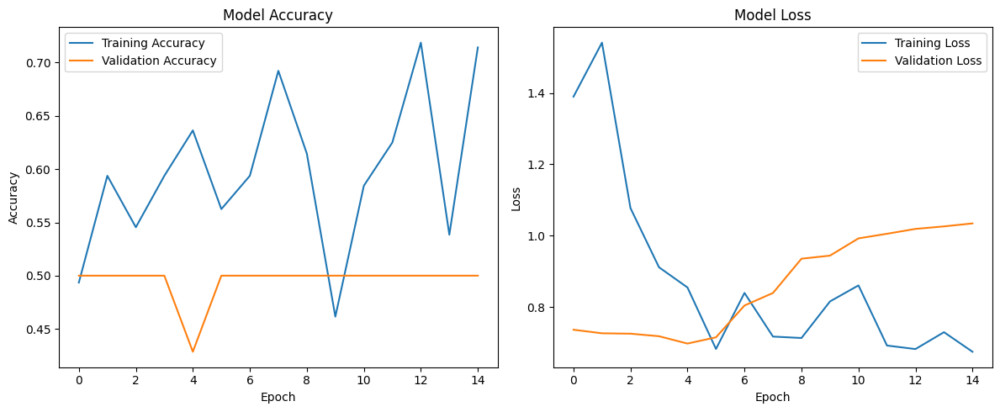

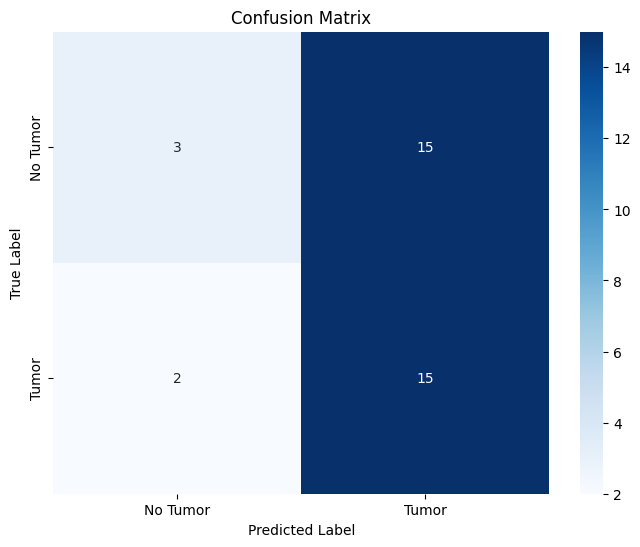

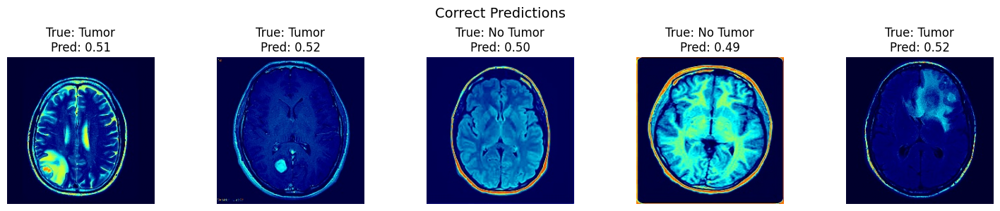

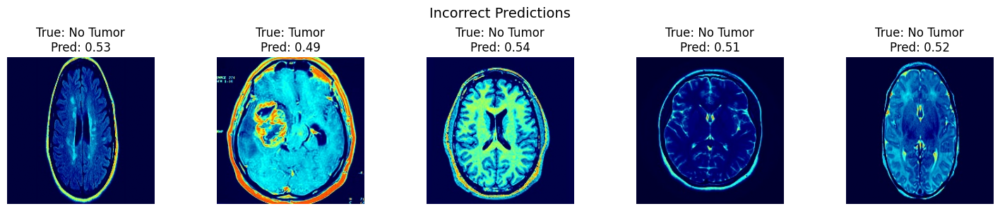


Test Accuracy: 0.5143

Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.17      0.26        18
           1       0.50      0.88      0.64        17

    accuracy                           0.51        35
   macro avg       0.55      0.52      0.45        35
weighted avg       0.55      0.51      0.44        35


Colormap Performance Comparison:
--------------------------------------------------
Jet colormap: 0.6571 accuracy
Viridis colormap: 0.5714 accuracy
Plasma colormap: 0.4857 accuracy
Custom colormap: 0.5143 accuracy
--------------------------------------------------


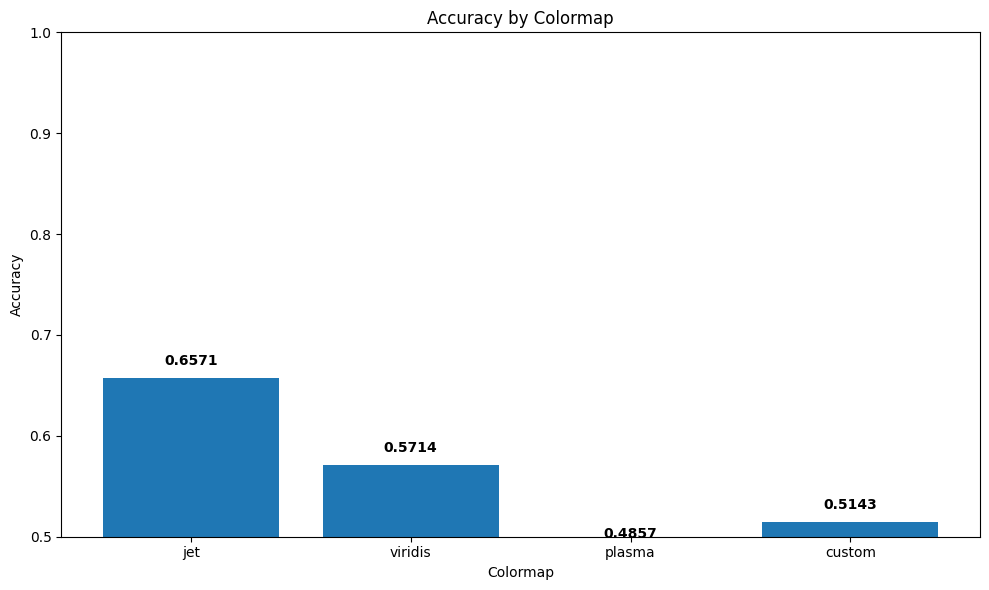


Training final model with the best colormap: jet
Loading jet colorized images...
Found 86 no images with jet colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Found 86 yes images with jet colormap


  0%|          | 0/86 [00:00<?, ?it/s]

Training set: 109 images
Validation set: 28 images
Test set: 35 images


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_24 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_28               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 224, 224, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_29               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_30               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (None, 112, 112, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_31               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_28 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_32               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_29 (Conv2D)                   │ (None, 56, 56, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_33               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 51,672,097 (197.11 MB)

 Trainable params: 51,670,177 (197.11 MB)

 Non-trainable params: 1,920 (7.50 KB)

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 22s 5s/step - accuracy: 0.5370 - auc: 0.5998 - loss: 1.1862 - val_accuracy: 0.5000 - val_auc: 0.7296 - val_loss: 0.6907 - learning_rate: 0.0010
Epoch 2/30
1/3 ━━━━━━━━━━━━━━━━━━━━ 11s 6s/step - accuracy: 0.5625 - auc: 0.6113 - loss: 1.7332

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 554ms/step - accuracy: 0.5625 - auc: 0.6113 - loss: 1.7332 - val_accuracy: 0.5000 - val_auc: 0.7117 - val_loss: 0.7498 - learning_rate: 0.0010
Epoch 3/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 5s/step - accuracy: 0.7504 - auc: 0.8407 - loss: 0.5144 - val_accuracy: 0.5000 - val_auc: 0.6684 - val_loss: 1.2544 - learning_rate: 0.0010
Epoch 4/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 523ms/step - accuracy: 0.7188 - auc: 0.8125 - loss: 0.6286 - val_accuracy: 0.5000 - val_auc: 0.6607 - val_loss: 1.4826 - learning_rate: 0.0010
Epoch 5/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 6s/step - accuracy: 0.6962 - auc: 0.7816 - loss: 0.6994 - val_accuracy: 0.5000 - val_auc: 0.5204 - val_loss: 2.2424 - learning_rate: 0.0010
Epoch 6/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 617ms/step - accuracy: 0.6250 - auc: 0.6484 - loss: 0.9107 - val_accuracy: 0.5000 - val_auc: 0.5612 - val_loss: 2.8622 - learning_rate: 0.0010
Epoch 7/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 17s 7s/step - accuracy: 0.7198 - auc: 0.8222 - loss: 0.5462 - val_acc

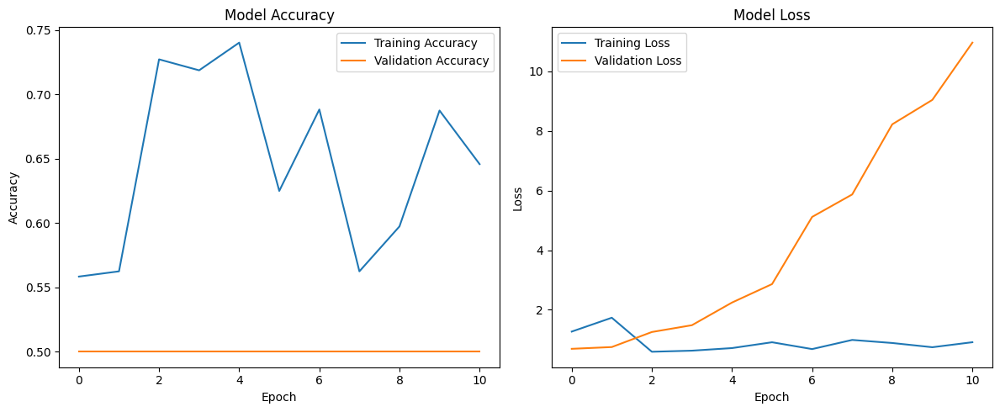

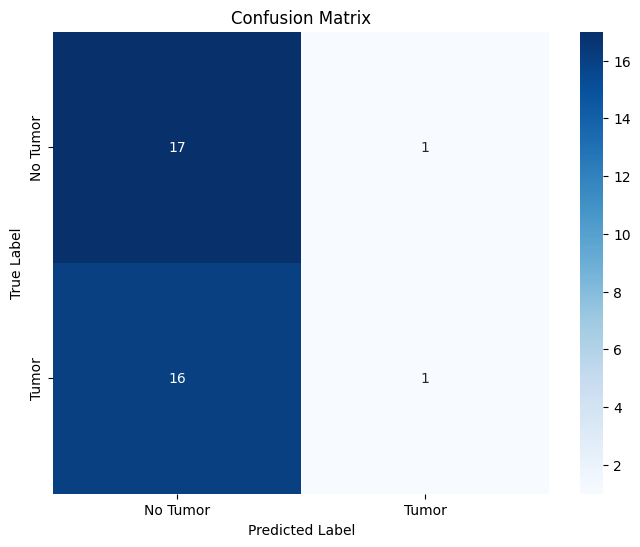

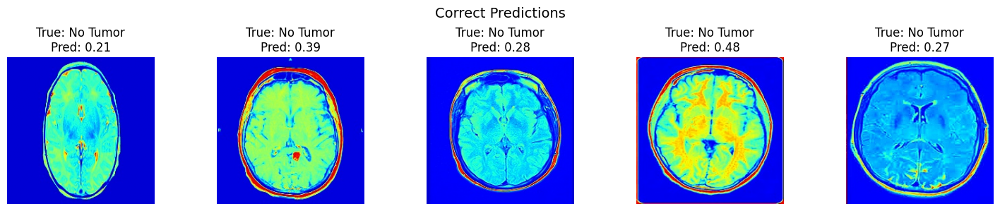

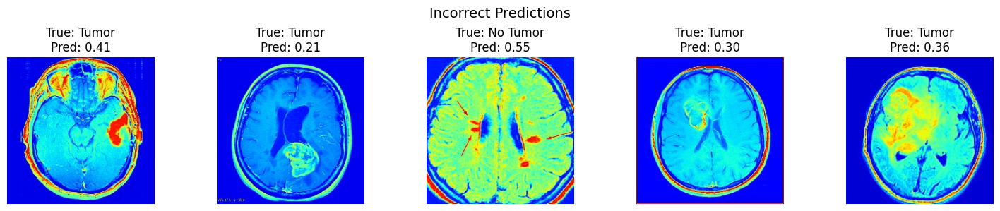


Test Accuracy: 0.5143

Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.94      0.67        18
           1       0.50      0.06      0.11        17

    accuracy                           0.51        35
   macro avg       0.51      0.50      0.39        35
weighted avg       0.51      0.51      0.39        35

Final model saved to /kaggle/working/brain_tumor_model.h5

Percentage of correct predictions: 51.43%
Percentage of wrong predictions: 48.57%


In [20]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.notebook import tqdm
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def load_colorized_images(base_path, colormap_type='custom', target_size=(224, 224)):
    """
    Load colorized images from the specified directory.
    
    Args:
        base_path: Path to the directory containing 'yes' and 'no' subdirectories
        colormap_type: Type of colormap to use ('jet', 'viridis', 'plasma', 'custom')
        target_size: Target size for the images
        
    Returns:
        X: Array of images
        y: Array of labels (1 for tumor, 0 for no tumor)
    """
    images = []
    labels = []
    categories = ['no', 'yes']
    
    print(f"Loading {colormap_type} colorized images...")
    for category in categories:
        category_path = Path(base_path) / category
        if not category_path.exists():
            print(f"Warning: Path {category_path} does not exist")
            continue
        
        # Look for files with the specified colormap
        pattern = f"*_{colormap_type}.jpg"
        image_files = list(category_path.glob(pattern))
        print(f"Found {len(image_files)} {category} images with {colormap_type} colormap")
        
        for img_path in tqdm(image_files):
            try:
                # Read image
                img = cv2.imread(str(img_path))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
                img = cv2.resize(img, target_size)
                img = img / 255.0  # Normalize to [0,1]
                
                images.append(img)
                labels.append(1 if category == 'yes' else 0)
                
            except Exception as e:
                print(f"Error loading {img_path}: {e}")
    
    return np.array(images), np.array(labels)

def create_model(input_shape=(224, 224, 3)):
    """
    Create a CNN model for brain tumor detection.
    """
    model = Sequential([
        # First convolutional block
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape),
        BatchNormalization(),
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        
        # Second convolutional block
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        
        # Third convolutional block
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        
        # Fully connected layers
        Flatten(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(1, activation='sigmoid')  # Binary classification
    ])
    
    model.compile(
        optimizer='adam',
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    
    return model

def train_and_evaluate(X, y, batch_size=32, epochs=30):
    """
    Train and evaluate the model using cross-validation.
    """
    # Split data into train, validation, and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
    
    print(f"Training set: {X_train.shape[0]} images")
    print(f"Validation set: {X_val.shape[0]} images")
    print(f"Test set: {X_test.shape[0]} images")
    
    # Data augmentation for training set
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    datagen.fit(X_train)
    
    # Create model
    model = create_model(input_shape=X_train[0].shape)
    model.summary()
    
    # Callbacks
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )
    
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=5,
        min_lr=1e-6
    )
    
    # Train model
    history = model.fit(
        datagen.flow(X_train, y_train, batch_size=batch_size),
        steps_per_epoch=len(X_train) // batch_size,
        epochs=epochs,
        validation_data=(X_val, y_val),
        callbacks=[early_stopping, reduce_lr]
    )
    
    # Evaluate on test set
    y_pred_prob = model.predict(X_test)
    y_pred = (y_pred_prob > 0.5).astype(int).reshape(-1)
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    
    # Plot metrics
    plot_history(history)
    plot_confusion_matrix(conf_matrix)
    
    # Plot some predictions
    plot_predictions(X_test, y_test, y_pred, y_pred_prob, num_samples=5)
    
    print(f"\nTest Accuracy: {accuracy:.4f}")
    print("\nClassification Report:")
    print(report)
    
    return model, history, accuracy, report, conf_matrix

def plot_history(history):
    """Plot training history."""
    plt.figure(figsize=(12, 5))
    
    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(conf_matrix):
    """Plot confusion matrix."""
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=['No Tumor', 'Tumor'],
                yticklabels=['No Tumor', 'Tumor'])
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

def plot_predictions(X, y_true, y_pred, y_pred_prob, num_samples=5):
    """
    Plot random samples with their true and predicted labels.
    """
    # Get indices of correct and incorrect predictions
    correct_indices = np.where(y_true == y_pred)[0]
    incorrect_indices = np.where(y_true != y_pred)[0]
    
    # Sample indices for visualization
    num_correct = min(num_samples, len(correct_indices))
    num_incorrect = min(num_samples, len(incorrect_indices))
    
    correct_samples = np.random.choice(correct_indices, num_correct, replace=False)
    incorrect_samples = np.random.choice(incorrect_indices, num_incorrect, replace=False) if len(incorrect_indices) > 0 else []
    
    # Plot correct predictions
    if len(correct_samples) > 0:
        plt.figure(figsize=(15, 3))
        plt.suptitle('Correct Predictions', fontsize=14)
        
        for i, idx in enumerate(correct_samples):
            plt.subplot(1, num_correct, i + 1)
            plt.imshow(X[idx])
            plt.title(f"True: {'Tumor' if y_true[idx] == 1 else 'No Tumor'}\nPred: {y_pred_prob[idx][0]:.2f}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    # Plot incorrect predictions
    if len(incorrect_samples) > 0:
        plt.figure(figsize=(15, 3))
        plt.suptitle('Incorrect Predictions', fontsize=14)
        
        for i, idx in enumerate(incorrect_samples):
            plt.subplot(1, num_incorrect, i + 1)
            plt.imshow(X[idx])
            plt.title(f"True: {'Tumor' if y_true[idx] == 1 else 'No Tumor'}\nPred: {y_pred_prob[idx][0]:.2f}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

def compare_colormaps(base_path, target_size=(224, 224)):
    """
    Compare model performance across different colormap types.
    """
    colormaps = ['jet', 'viridis', 'plasma', 'custom']
    results = {}
    
    for cmap in colormaps:
        print(f"\n{'-'*50}")
        print(f"Training and evaluating model with {cmap} colormap")
        print(f"{'-'*50}")
        
        # Load images
        X, y = load_colorized_images(base_path, colormap_type=cmap, target_size=target_size)
        
        if len(X) == 0:
            print(f"No images found for {cmap} colormap. Skipping...")
            continue
        
        # Train and evaluate
        _, _, accuracy, report, _ = train_and_evaluate(X, y, epochs=20)
        
        # Store results
        results[cmap] = {
            'accuracy': accuracy,
            'report': report
        }
    
    # Compare results
    print("\nColormap Performance Comparison:")
    print("-" * 50)
    for cmap, metrics in results.items():
        print(f"{cmap.capitalize()} colormap: {metrics['accuracy']:.4f} accuracy")
    print("-" * 50)
    
    # Plot comparison
    plt.figure(figsize=(10, 6))
    plt.bar(results.keys(), [r['accuracy'] for r in results.values()])
    plt.title('Accuracy by Colormap')
    plt.xlabel('Colormap')
    plt.ylabel('Accuracy')
    plt.ylim(0.5, 1.0)
    for i, (cmap, metrics) in enumerate(results.items()):
        plt.text(i, metrics['accuracy'] + 0.01, f"{metrics['accuracy']:.4f}", 
                 ha='center', va='bottom', fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return results

def main():
    # Set paths
    base_path = "/kaggle/working/colorized_images"
    
    # Option 1: Compare performance across different colormaps
    results = compare_colormaps(base_path)
    
    # Option 2: Train model with the best colormap
    # Find best colormap from the results
    if results:
        best_cmap = max(results.items(), key=lambda x: x[1]['accuracy'])[0]
        print(f"\nTraining final model with the best colormap: {best_cmap}")
        
        # Load images with the best colormap
        X, y = load_colorized_images(base_path, colormap_type=best_cmap)
        
        # Train final model
        model, _, accuracy, report, conf_matrix = train_and_evaluate(X, y, epochs=30)
        
        # Save the model
        model.save('/kaggle/working/brain_tumor_model.h5')
        print(f"Final model saved to /kaggle/working/brain_tumor_model.h5")
        
        # Calculate percentage of right and wrong predictions
        tn, fp, fn, tp = conf_matrix.ravel()
        total = tn + fp + fn + tp
        correct_percentage = (tn + tp) / total * 100
        wrong_percentage = (fp + fn) / total * 100
        
        print(f"\nPercentage of correct predictions: {correct_percentage:.2f}%")
        print(f"Percentage of wrong predictions: {wrong_percentage:.2f}%")

if __name__ == "__main__":
    main()